In [1]:
from google.genai import Client
from dotenv import load_dotenv
import os
load_dotenv()

client = Client(api_key=os.getenv("GEMINI_API_KEY"))

In [15]:
from PIL import Image, ImageEnhance
player_regions = Image.open("./public/player-regions.png")
scoring_rules = Image.open("./public/scoring-rules.jpg")
score_table = Image.open("./public/score-table.jpg")

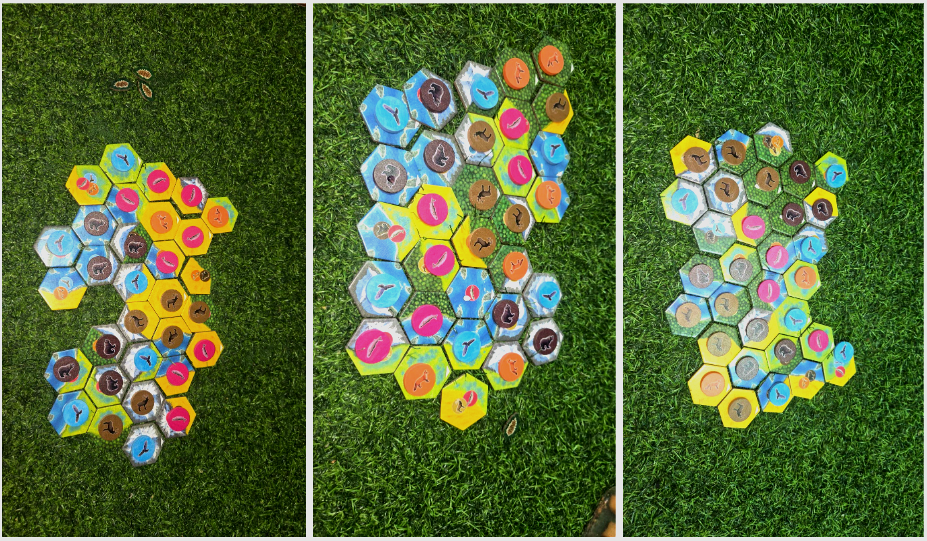

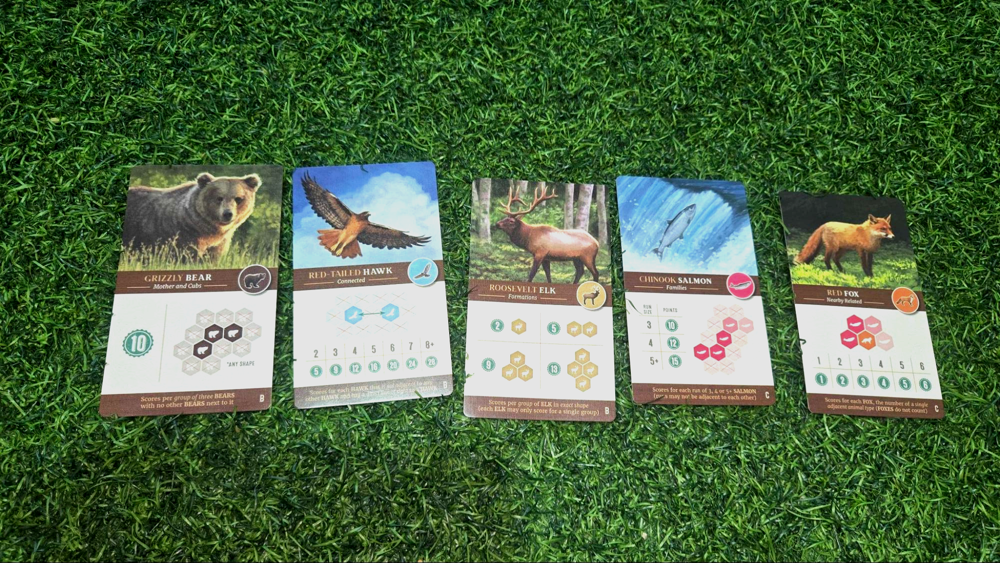

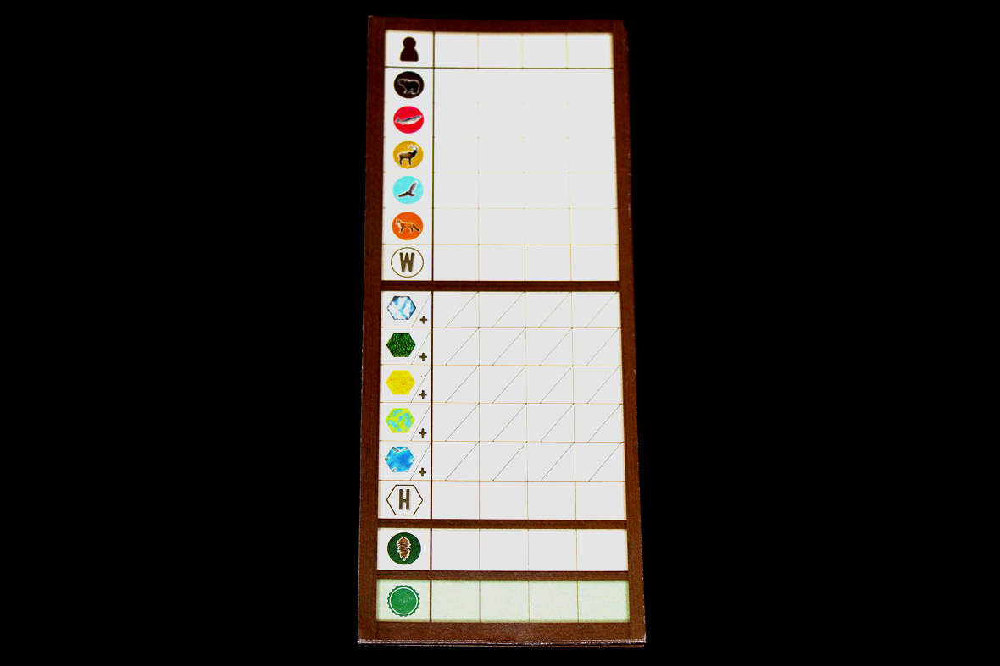

In [16]:
def enrich_image(image: Image.Image, rotate: int = None) -> Image.Image:
    img = ImageEnhance.Contrast(image).enhance(1.3)
    img = ImageEnhance.Brightness(img).enhance(0.9)
    img = ImageEnhance.Sharpness(img).enhance(1.1)
    if rotate:
        img = img.rotate(rotate, expand=True)
    return img

player_regions = enrich_image(player_regions)
scoring_rules = enrich_image(scoring_rules, rotate=-90)
score_table = enrich_image(score_table)
display(player_regions)
display(scoring_rules)
display(score_table)

In [52]:
import cv2
import numpy as np
from typing import Dict
from PIL import Image

def preprocess_board_image(
    image_path: str,
    resize: int = 1024,
    rotate: int = 0,
    visualize_contours: bool = True
) -> Dict[str, np.ndarray]:
    """
    Preprocess a board-game image to improve tile recognition & counting.

    Returns a dict of intermediate images so you can easily display or debug.
    """

    # ---------- 1. LOAD & RESIZE ----------
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    if rotate != 0:
        center = (img.shape[1] // 2, img.shape[0] // 2)
        matrix = cv2.getRotationMatrix2D(center, rotate, 1.0)
        img = cv2.warpAffine(img, matrix, (img.shape[1], img.shape[0]))

    img = cv2.resize(img, (resize, resize))

    # ---------- 2. GRASS / GREEN SUPPRESSION ----------
    b, g, r = cv2.split(img)

    # Reduce green dominance (tuned for grass)
    g = cv2.subtract(g, 40)

    no_grass = cv2.merge([b, g, r])

    # ---------- 3. LIGHTING NORMALIZATION (CLAHE) ----------
    lab = cv2.cvtColor(no_grass, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    l = clahe.apply(l)

    lab = cv2.merge((l, a, b))
    normalized = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    # ---------- 4. EDGE ENHANCEMENT ----------
    gray = cv2.cvtColor(normalized, cv2.COLOR_BGR2GRAY)

    edges = cv2.Canny(gray, 80, 160)
    edges = cv2.dilate(edges, None, iterations=1)

    # ---------- 5. BINARY SEGMENTATION ----------
    _, binary = cv2.threshold(
        gray, 0, 255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # Morphological cleanup
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # ---------- 6. CONTOUR DETECTION ----------
    contours, _ = cv2.findContours(
        binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    contour_vis = normalized.copy()
    valid_contours = []

    for c in contours:
        area = cv2.contourArea(c)
        # Area filter tuned for hex tiles at 1024px
        if 800 < area < 6000:
            valid_contours.append(c)
            if visualize_contours:
                cv2.drawContours(contour_vis, [c], -1, (0, 0, 255), 2)

    # ---------- 7. EDGE + COLOR COMBINED (BEST FOR LLM) ----------
    combined = cv2.addWeighted(
        normalized, 0.75,
        cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR), 0.25,
        0
    )

    # ---------- 8. RETURN EVERYTHING ----------
    return {
        "original": img,
        "no_grass": no_grass,
        "normalized": normalized,
        "edges": edges,
        "binary": binary,
        "combined": combined,
        "contours": contour_vis,
        "tile_count": len(valid_contours),
    }
player_regions = preprocess_board_image("./public/player-regions.png")
scoring_rules = preprocess_board_image("./public/scoring-rules.jpg", rotate=-90)
score_table = preprocess_board_image("./public/score-table.jpg")

In [29]:
from PIL import Image
import io

def pil_to_bytes(img: Image.Image, format: str = "PNG") -> bytes:
    buffer = io.BytesIO()
    img.save(buffer, format=format)
    return buffer.getvalue()
player_regions_bytes = pil_to_bytes(player_regions, format="PNG")
scoring_rules_bytes = pil_to_bytes(scoring_rules, format="PNG")
score_table_bytes = pil_to_bytes(score_table, format="PNG")

In [54]:
player_regions_bytes =pil_to_bytes(Image.fromarray(cv2.cvtColor(player_regions['combined'], cv2.COLOR_BGR2RGB)))
scoring_rules_bytes =pil_to_bytes(Image.fromarray(cv2.cvtColor(scoring_rules['combined'], cv2.COLOR_BGR2RGB)))
score_table_bytes =pil_to_bytes(Image.fromarray(cv2.cvtColor(score_table['combined'], cv2.COLOR_BGR2RGB)))

In [32]:
with open("./public/Cascadia-Rules.pdf", "rb") as f:
    rules_pdf = f.read()

In [ ]:
from google.genai import types
from google.genai import Client
from dotenv import load_dotenv
import os
load_dotenv()

client = Client(api_key=os.getenv("GEMINI_API_KEY"))

response = client.models.generate_content(
    model="gemini-3-flash-preview",
    contents=[
        types.Part.from_bytes(
            data=player_regions_bytes,
            mime_type="image/png",
            # media_resolution="MEDIA_RESOLUTION_ULTRA_HIGH"
        ),
        types.Part.from_bytes(
            data=scoring_rules_bytes,
            mime_type="image/png",
            # media_resolution="MEDIA_RESOLUTION_ULTRA_HIGH"
        ),
        types.Part.from_bytes(
            data=score_table_bytes,
            mime_type="image/png",
            # media_resolution="MEDIA_RESOLUTION_ULTRA_HIGH"
        ),
        types.Part.from_bytes(
            data=rules_pdf,
            mime_type="application/pdf"
        ),
        types.Part.from_text(
            text="""
            You are a board-game scoring assistant.

            You are given MULTIPLE inputs:
            1) Player region board image (tiles on grass background)
            2) Scoring rules image
            3) Empty scoring table image
            4) Rules PDF (authoritative reference)

            TASK:
            Fill the scoring table STRICTLY based on the provided visual inputs.

            PROCESS (internal, do NOT output):
            - Identify each distinct tile in the player region image.
            - Count tiles by type, color, and grouping as required by the rules.
            - Cross-check scoring logic using the rules image and PDF.
            - Validate counts visually; do NOT infer missing tiles.

            OUTPUT RULES:
            - Output ONLY the completed table
            - Use Markdown table format
            - Use integers only
            - Preserve the exact table structure (rows, columns, labels) (image icons no need, place text name when image present).
            - If any value cannot be determined visually, write "UNDETERMINED"
            - Do NOT explain reasoning
            - Do NOT guess
            """
        ),
    ],
    config=types.GenerateContentConfig(
        temperature=0.1,
        top_p=0.95,
        thinking_config=types.ThinkingConfig(
            thinking_level="medium"
        )
    )
)
with open("response.md", "w", encoding="utf-8") as f:
    f.write(response.text)

In [56]:
from IPython.display import display_markdown, Markdown
display_markdown(Markdown(response.text))

| Category | Player 1 | Player 2 | Player 3 |
| :--- | :---: | :---: | :---: |
| Grizzly Bear | 11 | 11 | 11 |
| Chinook Salmon | 12 | 12 | 12 |
| Roosevelt Elk | 13 | 13 | 13 |
| Red-Tailed Hawk | 11 | 11 | 11 |
| Red Fox | 11 | 11 | 11 |
| Wildlife Total | 58 | 58 | 58 |
| Mountains | 6 | 6 | 6 |
| Forests | 4 | 4 | 4 |
| Prairies | 7 | 7 | 7 |
| Wetlands | 8 | 8 | 8 |
| Rivers | 5 | 5 | 5 |
| Habitat Total | 30 | 30 | 30 |
| Nature Tokens | 2 | 2 | 2 |
| Final Score | 90 | 90 | 90 |